### Importing Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
import IPython.display as ipd
import os
import re
import csv
import pandas as pd
from pydub import AudioSegment 

C:\Users\H P\anaconda3\lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


### Preparing data for preproccessing

In [ ]:
# Define the path to the main directory containing subdirectories with audio files
main_directory = 'EYASE'

# Loop over each subdirectory in the main directory
for subdir in os.listdir(main_directory):
    subdirectory_path = os.path.join(main_directory, subdir)

    # Check if the item in the main directory is a subdirectory
    if os.path.isdir(subdirectory_path):
        print(f"Processing files in subdirectory: {subdir}")

        # Loop over audio files in the subdirectory
        for audio_file in os.listdir(subdirectory_path):
            audio_file_path = os.path.join(subdirectory_path, audio_file)
            # Display the audio file using IPython.display.Audio
            display(ipd.Audio(audio_file_path))

Processing files in subdirectory: Female01


In [2]:
# Main directory containing subdirectories with .wav files
main_directory = 'EYASE'

# Define the regular expression pattern to extract information from the filename
pattern =  re.compile(r'(?P<gender>ml|fm)\d+_(?P<emotion>ang|hap|sad|neu).+\.wav')
# List to store extracted data
data_list = []

def get_audio_duration(file_path):
    audio = AudioSegment.from_file(file_path)
    return audio.duration_seconds

def extract_features(file_path):
    # Load the audio file
    audio, _ = librosa.load(file_path)

    # Calculate zero-crossing rate
    zero_crossing_rate = np.mean(librosa.feature.zero_crossing_rate(audio))

    # Calculate RMSE
    rmse = np.mean(librosa.feature.rms(y=audio))

    # Calculate MFCC
    mfccs = librosa.feature.mfcc(y=audio, n_mfcc=13).tolist()

    # Calculate Mel spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=audio).tolist()

    # Calculate chroma STFT
    chroma_stft = librosa.feature.chroma_stft(y=audio).tolist()

    return zero_crossing_rate, rmse, mfccs, mel_spectrogram, chroma_stft

# Loop through subdirectories in the main directory
for subdir in os.listdir(main_directory):
    subdirectory_path = os.path.join(main_directory, subdir)
    
    if os.path.isdir(subdirectory_path):
        # Loop through .wav files in each subdirectory
        for filename in os.listdir(subdirectory_path):
            if filename.endswith('.wav'):
                # Extract information using the regular expression pattern
                match = pattern.match(filename)

                if match:
                    # Get the extracted information
                    gender = match.group('gender')
                    raw_emotion = match.group('emotion')
                    
                    # Map raw emotion to labeled emotion
                    if raw_emotion.lower() == 'hap':
                        emotion = 'Happy'
                    elif raw_emotion.lower() == 'ang':
                        emotion = 'Angry'
                    elif raw_emotion.lower() == 'sad':
                        emotion = 'Sad'
                    elif raw_emotion.lower() == 'neu':
                        emotion = 'Neutral'

                    # Get audio duration
                    file_path = os.path.join(subdirectory_path, filename)
                    duration = get_audio_duration(file_path)

                    # Calculate additional features
                    zero_crossing_rate, rmse, mfccs, mel_spectrogram, chroma_stft = extract_features(file_path)

                    # Append data to the list
                    data_list.append({
                        'filename': filename,
                        'gender': 'Female' if 'fm' in filename.lower() else 'Male',
                        'emotion': emotion,
                        'subdirectory': subdir,
                        'duration': duration,
                        'zero_crossing_rate': np.mean(zero_crossing_rate),
                        'rmse': np.mean(rmse),
                        'mfccs': mfccs,
                        'mel_spectrogram': mel_spectrogram,
                        'chroma_stft': chroma_stft
                    })

# Define the CSV file path
csv_file_path = 'EYASE_with_features.csv'

# Write data to CSV file
fieldnames = ['filename', 'gender', 'emotion', 'subdirectory', 'duration',
              'zero_crossing_rate', 'rmse', 'mfccs', 'mel_spectrogram', 'chroma_stft']

with open(csv_file_path, 'w', newline='') as csvfile:
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    
    # Write the header
    writer.writeheader()
    
    # Write the data
    writer.writerows(data_list)

print(f'CSV file created at {csv_file_path}')

CSV file created at EYASE_with_features.csv


In [7]:
zero_crossing_rate.shape

()

### Exploratory Data Analysis

In [3]:
df = pd.read_csv('EYASE_with_features.csv')
df

,filename,gender,emotion,subdirectory,duration,zero_crossing_rate,rmse,mfccs,mel_spectrogram,chroma_stft
0,fm01_ang (1).wav,Female,Angry,Female01,2.031746,0.089605,0.059743,"[[-194.15260314941406, -158.66134643554688, -1...","[[0.03417998552322388, 0.052446670830249786, 0...","[[0.03275930508971214, 0.026697387918829918, 0..."
1,fm01_ang (10).wav,Female,Angry,Female01,2.304580,0.117168,0.022054,"[[-505.10284423828125, -462.3858642578125, -45...","[[0.001182525185868144, 0.0028629531152546406,...","[[0.5313377380371094, 0.7264270186424255, 0.64..."
2,fm01_ang (11).wav,Female,Angry,Female01,3.018594,0.108190,0.016739,"[[-480.9388732910156, -453.05108642578125, -45...","[[0.0006221650401130319, 0.0002771295257844031...","[[0.6210007071495056, 0.4512467384338379, 0.36..."
3,fm01_ang (12).wav,Female,Angry,Female01,2.600635,0.112655,0.029789,"[[-510.7855529785156, -475.5320739746094, -472...","[[0.0008585118339397013, 0.002965944819152355,...","[[0.4635086953639984, 0.477050244808197, 0.772..."
4,fm01_ang (13).wav,Female,Angry,Female01,2.101406,0.238335,0.016316,"[[-730.4960327148438, -730.4960327148438, -730...","[[6.54480358797116e-11, 2.2168486490947714e-10...","[[0.812794029712677, 0.7782590389251709, 0.723..."
...,...,...,...,...,...,...,...,...,...,...
574,ml03_sad (5).wav,Male,Sad,Male03,2.240726,0.165875,0.011384,"[[-513.7316284179688, -479.372802734375, -477....","[[0.0006126821390353143, 0.0002446062280796468...","[[0.4736095070838928, 0.3549465537071228, 0.37..."
575,ml03_sad (6).wav,Male,Sad,Male03,2.600635,0.137384,0.010429,"[[-508.1920471191406, -475.2695617675781, -480...","[[0.0027159356977790594, 0.0033905464224517345...","[[0.11117421090602875, 0.22585977613925934, 0...."
576,ml03_sad (7).wav,Male,Sad,Male03,2.275556,0.097760,0.007698,"[[-508.0637512207031, -475.18609619140625, -48...","[[0.0027162288315594196, 0.00339075387455523, ...","[[0.14139632880687714, 0.23638615012168884, 0...."
577,ml03_sad (8).wav,Male,Sad,Male03,2.159456,0.121353,0.012182,"[[-523.6361083984375, -490.0238342285156, -474...","[[0.003898829920217395, 0.005978614557534456, ...","[[0.7106698155403137, 0.49201518297195435, 0.3..."


In [4]:
df.describe()

,duration,zero_crossing_rate,rmse
count,579.000000,579.000000,579.000000
mean,2.332194,0.216463,0.017875
std,0.922716,0.133736,0.010220
min,0.783673,0.044803,0.002614
25%,1.648617,0.105501,0.010452
50%,2.159456,0.160374,0.015297
75%,2.780590,0.323177,0.022429
max,5.793379,0.568254,0.059743


Text(0.5, 1.0, 'Number of Audios per Gender')

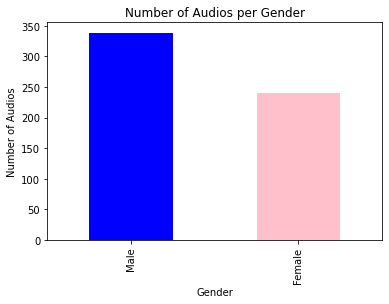

In [5]:
gender_count = df['gender'].value_counts()
gender_count.plot(kind = 'bar', color = ['blue','pink'])
plt.xlabel("Gender")
plt.ylabel("Number of Audios")
plt.title("Number of Audios per Gender")

Text(0.5, 1.0, 'Number of Audios per Emotion')

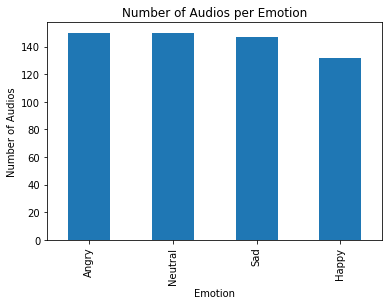

In [6]:
emotion_count = df['emotion'].value_counts()
emotion_count.plot(kind = 'bar')
plt.xlabel("Emotion")
plt.ylabel("Number of Audios")
plt.title("Number of Audios per Emotion")